# Load dependencies

In [ ]:
import os

In [ ]:
if not os.path.isdir('k'):
  !git clone https://github.com/joaopauloschuler/k-neural-api.git k
else:
  !cd k && git pull

!cd k && pip install .

import cai.datasets
import cai.models
import cai.util
import cai.gradientascent

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import IPython.display as display
import PIL.Image
from tensorflow.keras.preprocessing import image
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
tf.get_logger().setLevel('ERROR')

# Load input image

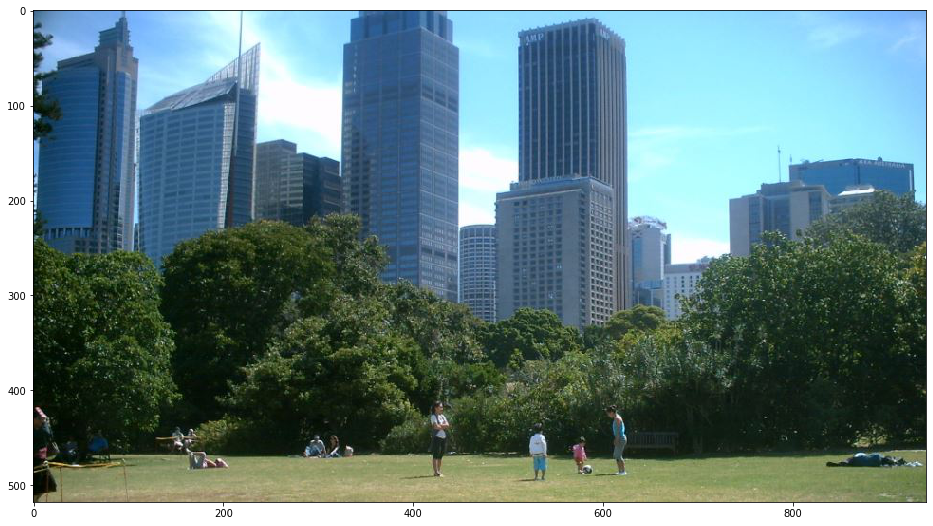

In [ ]:
url = 'https://github.com/joaopauloschuler/neural-api/blob/master/docs/park.jpg?raw=true'
local_file_name = 'img.jpg'
cai.datasets.download_file(url, local_file=local_file_name)
original_img = load_img(local_file_name)
original_img = img_to_array(original_img, dtype='float32')
cai.util.preprocess(original_img, bipolar=False)

plt.figure(figsize = (16, 16))
plt.imshow(original_img, interpolation='nearest', aspect='equal')
plt.show()

# Create the partial model and run gradient ascent

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


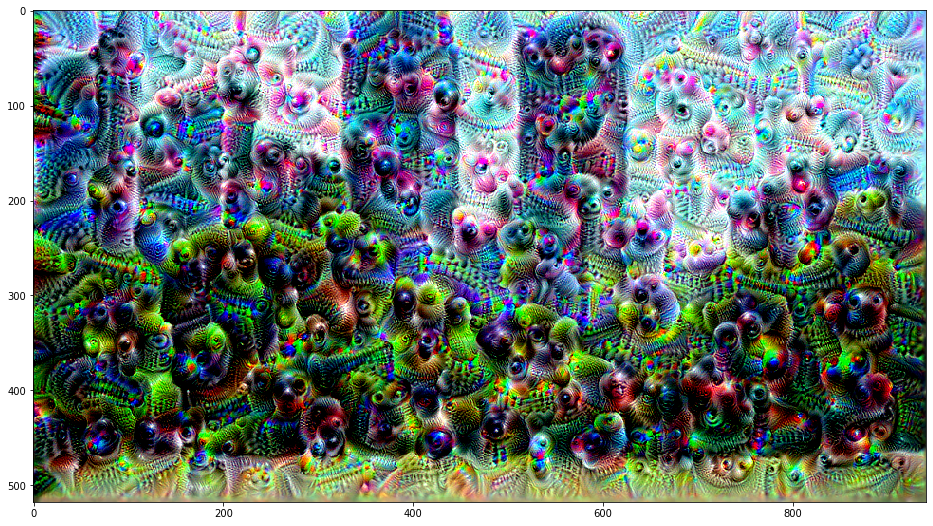

In [ ]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
pmodel = cai.models.CreatePartialModel(base_model, 'mixed3')
new_img = cai.gradientascent.run_gradient_ascent_octaves(img=original_img, partial_model=pmodel, low_range=-4, high_range=1)
plt.figure(figsize = (16, 16))
plt.imshow(new_img, interpolation='nearest', aspect='equal')
plt.show()

# Run gradient ascent for all layers

Computing gradient ascent for layer: mixed0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


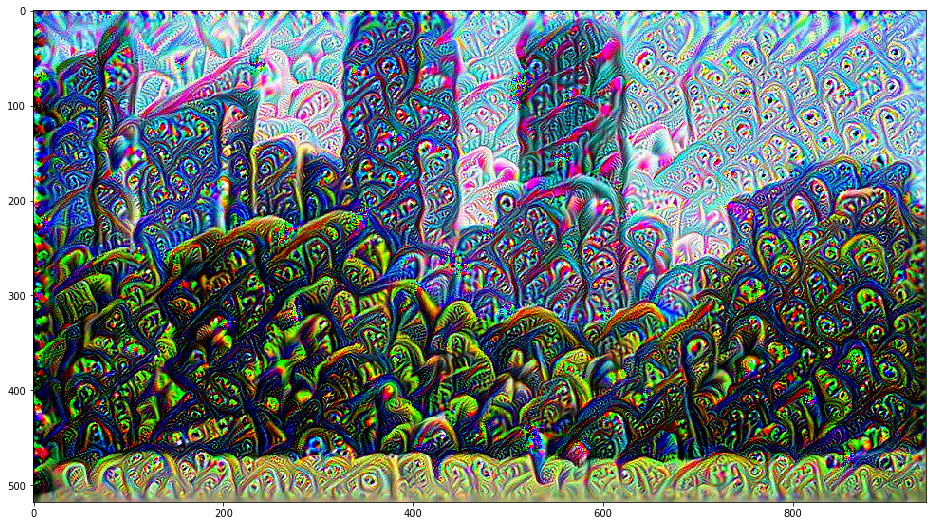

Computing gradient ascent for layer: mixed1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


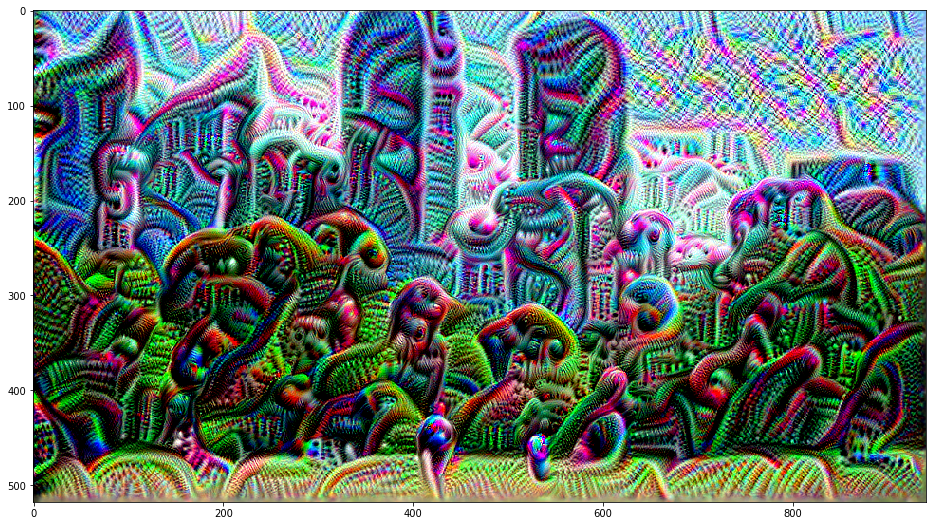

Computing gradient ascent for layer: mixed2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


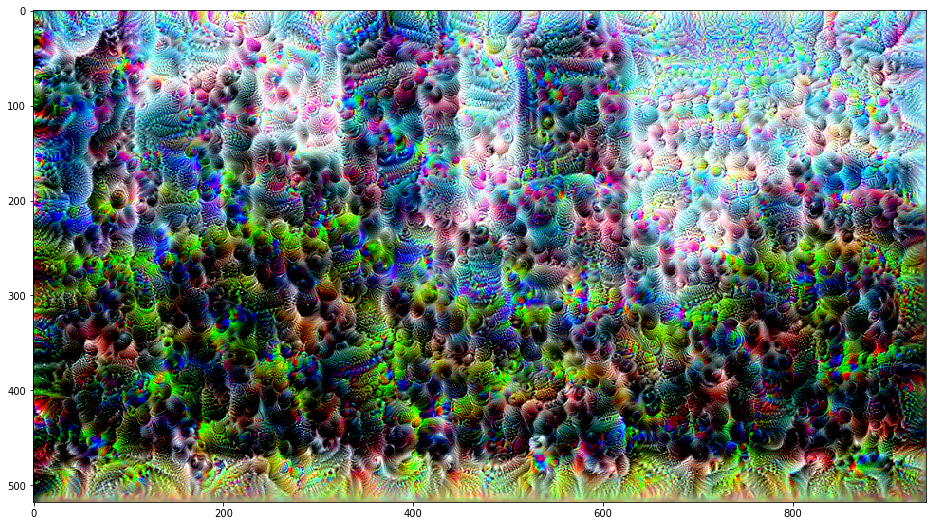

Computing gradient ascent for layer: mixed3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


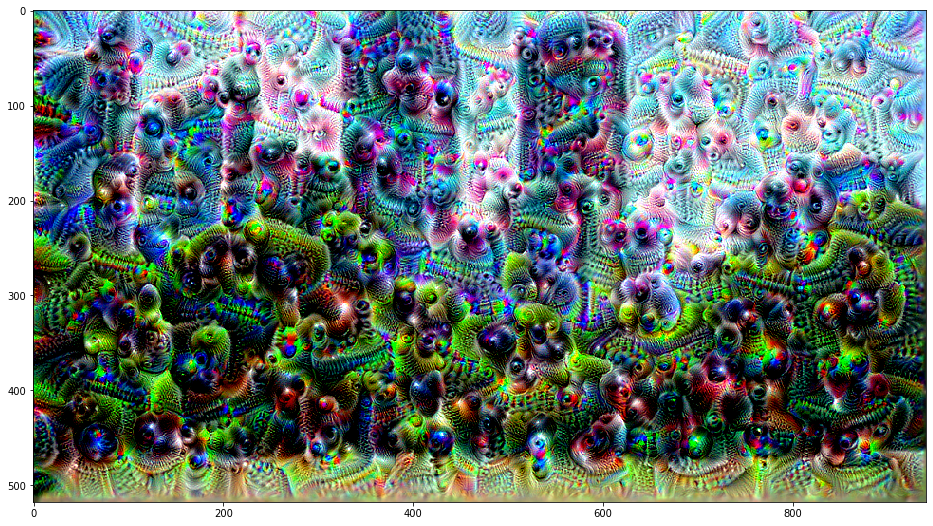

Computing gradient ascent for layer: mixed4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


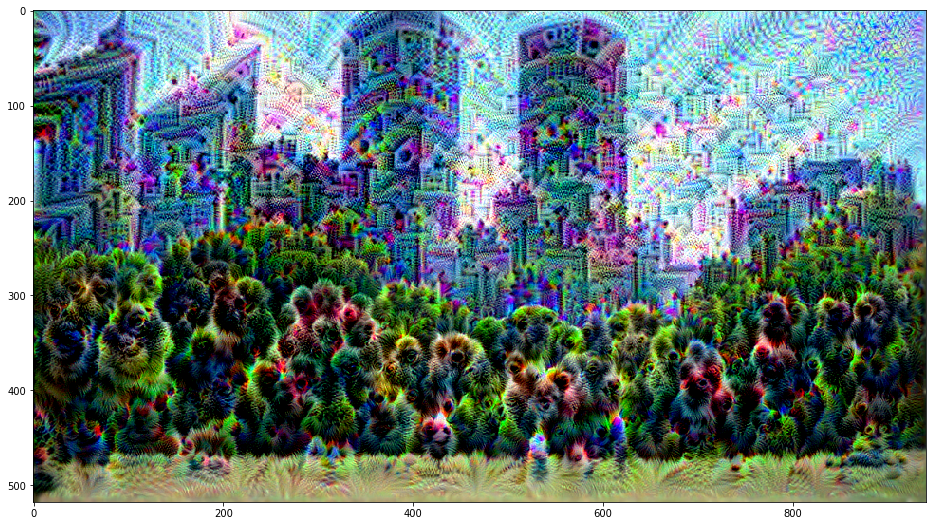

Computing gradient ascent for layer: mixed5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


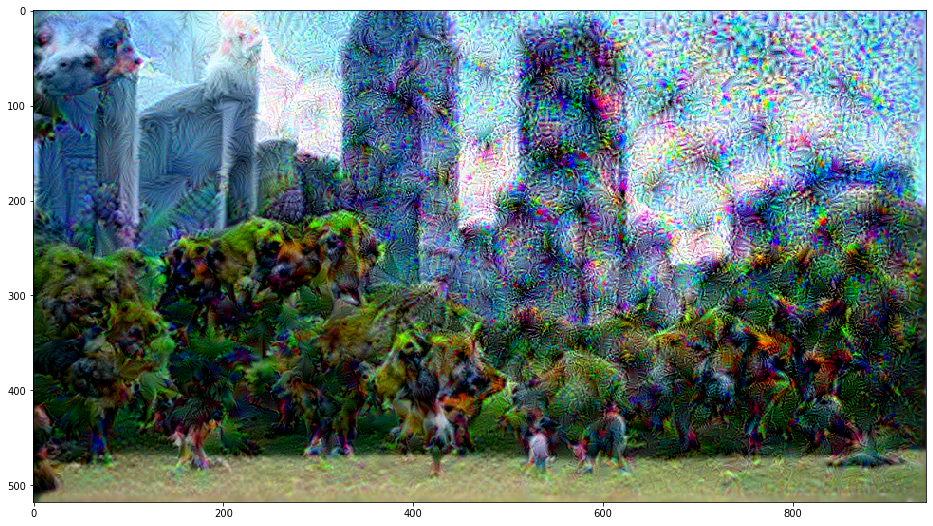

Computing gradient ascent for layer: mixed6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


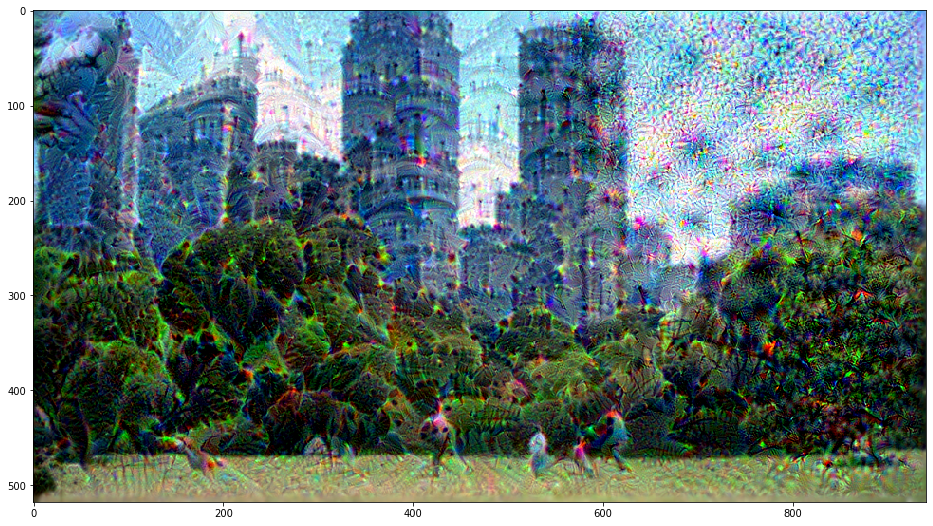

Computing gradient ascent for layer: mixed7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


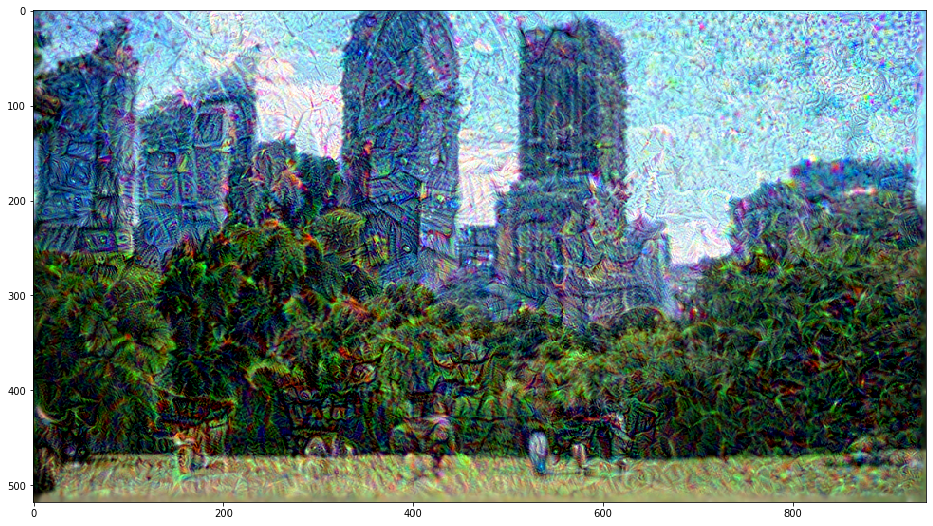

Computing gradient ascent for layer: mixed8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


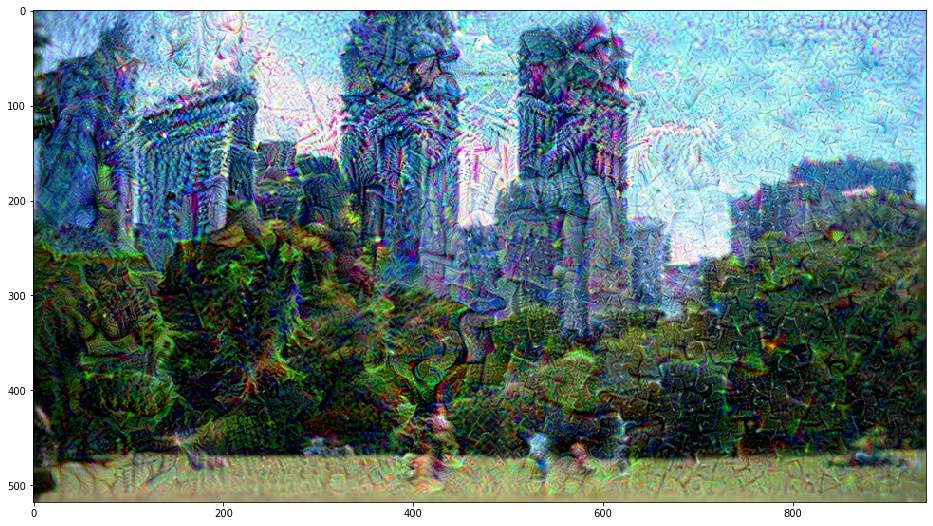

Computing gradient ascent for layer: mixed9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


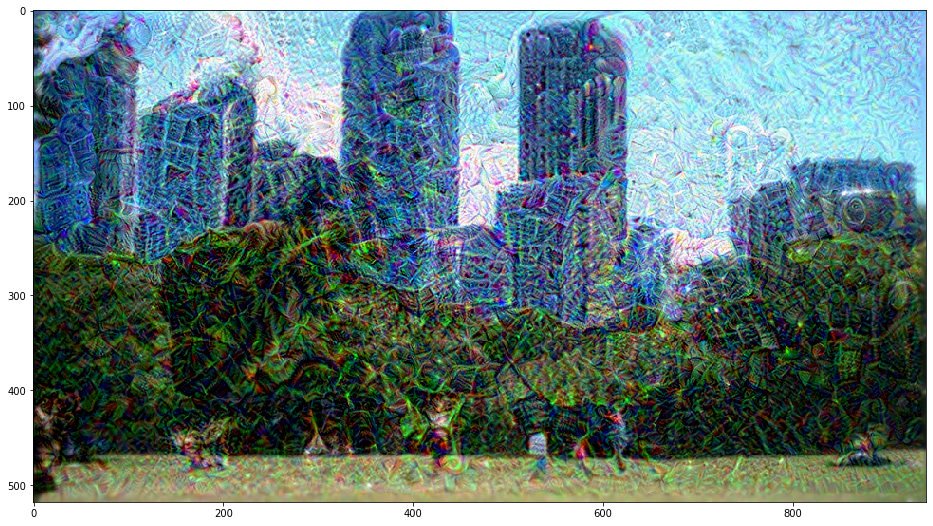

In [ ]:
for i in range(10):
  layer_name = 'mixed' + str(i)
  print('Computing gradient ascent for layer:', layer_name)
  pmodel = cai.models.CreatePartialModel(base_model, layer_name)
  new_img = cai.gradientascent.run_gradient_ascent_octaves(img=original_img, partial_model=pmodel, low_range=-4, high_range=1)
  plt.figure(figsize = (16, 16))
  plt.imshow(new_img, interpolation='nearest', aspect='equal')
  plt.show()